In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
# plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

# Financial Data and Preprocessing 

## Getting data from Yahoo Finance

1. Import the libraries:

In [3]:
import pandas as pd 
import yfinance as yf

2. Download the data:

In [4]:
ticker_symbol = "AAPL"

df_yahoo = yf.download(ticker_symbol, 
                       start='2000-01-01', 
                       end='2011-01-01', #Note that end is not included for y_finance
                       progress=False)

3. Inspect the data:

In [5]:
print(f'Downloaded {df_yahoo.shape[0]} rows of data.')
df_yahoo.tail() # for some reason it is incorrect in the image from the book

Downloaded 2767 rows of data.


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-12-27,11.530357,11.622857,11.482857,11.595715,10.020309,249816000
2010-12-28,11.639643,11.666429,11.609285,11.623929,10.044692,175924000
2010-12-29,11.650714,11.658929,11.610714,11.617500,10.039138,163139200
2010-12-30,11.624286,11.625357,11.537500,11.559286,9.988830,157494400
2010-12-31,11.533929,11.552857,11.475357,11.520000,9.954883,193508000


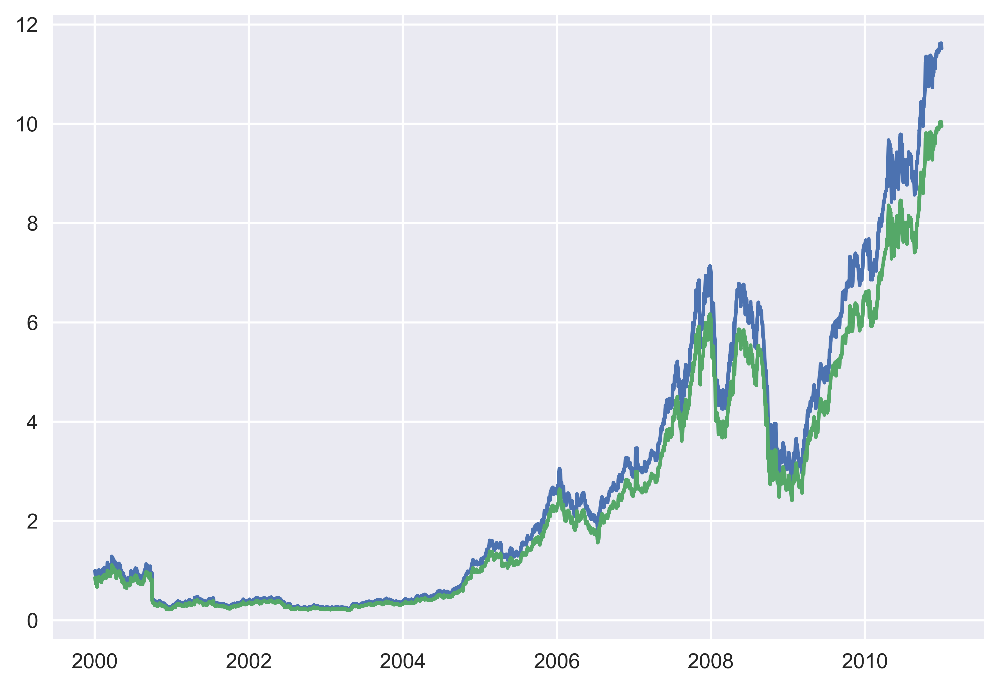

In [6]:
plt.plot(df_yahoo.index,df_yahoo.Close,df_yahoo.index,df_yahoo["Adj Close"])

## Getting data from Quandl 

1. Import the libraries:

In [7]:
import pandas as pd 
import quandl

2. Authenticate using the personal API key:

In [8]:
QUANDL_KEY = '2NfuwGG8_oyV5Tj3Zr9k' # replace {key} with your own API key  
quandl.ApiConfig.api_key = QUANDL_KEY

3. Download the data:

In [9]:
df_quandl = quandl.get(dataset='WIKI/AAPL',
                       start_date='2000-01-01', 
                       end_date='2010-12-31')

4. Inspect the data:

In [10]:
df_yahoo.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-12-27,11.530357,11.622857,11.482857,11.595715,10.020309,249816000
2010-12-28,11.639643,11.666429,11.609285,11.623929,10.044692,175924000
2010-12-29,11.650714,11.658929,11.610714,11.617500,10.039138,163139200
2010-12-30,11.624286,11.625357,11.537500,11.559286,9.988830,157494400
2010-12-31,11.533929,11.552857,11.475357,11.520000,9.954883,193508000


In [11]:
df_quandl.tail()

,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,,,,,,,,
2010-12-27,322.8519,325.44,321.52,324.68,8922000.0,0.0,1.0,41.490969,41.823576,41.319801,41.725905,62454000.0
2010-12-28,325.9102,326.66,325.06,325.47,6283000.0,0.0,1.0,41.884003,41.980363,41.774741,41.827431,43981000.0
2010-12-29,326.2200,326.45,325.10,325.29,5826400.0,0.0,1.0,41.923817,41.953375,41.779881,41.804299,40784800.0
2010-12-30,325.4800,325.51,323.05,323.66,5624800.0,0.0,1.0,41.828716,41.832572,41.516428,41.594821,39373600.0
2010-12-31,322.9500,323.48,321.31,322.56,6911000.0,0.0,1.0,41.503576,41.571689,41.292813,41.453456,48377000.0


In [12]:
print(f'Downloaded {df_quandl.shape[0]} rows of data.')

df_quandl.head()

Downloaded 2767 rows of data.


,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,,,,,,,,
2000-01-03,104.87,112.50,101.69,111.94,4783900.0,0.0,1.0,3.369314,3.614454,3.267146,3.596463,133949200.0
2000-01-04,108.25,110.62,101.19,102.50,4574800.0,0.0,1.0,3.477908,3.554053,3.251081,3.293170,128094400.0
2000-01-05,103.75,110.56,103.00,104.00,6949300.0,0.0,1.0,3.333330,3.552125,3.309234,3.341362,194580400.0
2000-01-06,106.12,107.00,95.00,95.00,6856900.0,0.0,1.0,3.409475,3.437748,3.052206,3.052206,191993200.0
2000-01-07,96.50,101.00,95.50,99.50,4113700.0,0.0,1.0,3.100399,3.244977,3.068270,3.196784,115183600.0


In [13]:
scaling_factor_adjusted = df_quandl["Adj. Close"].iloc[-1]/ df_yahoo["Adj Close"].iloc[-1]

In [14]:
scaling_factor_adjusted

4.164133049437477

In [15]:
from math import isclose

In [16]:
for i in range(5):
    print(isclose(scaling_factor_adjusted*df_yahoo["Adj Close"].iloc[-i], df_quandl["Adj. Close"].iloc[-i], rel_tol=1e-4, abs_tol=0.0))

True
True
True
True
True


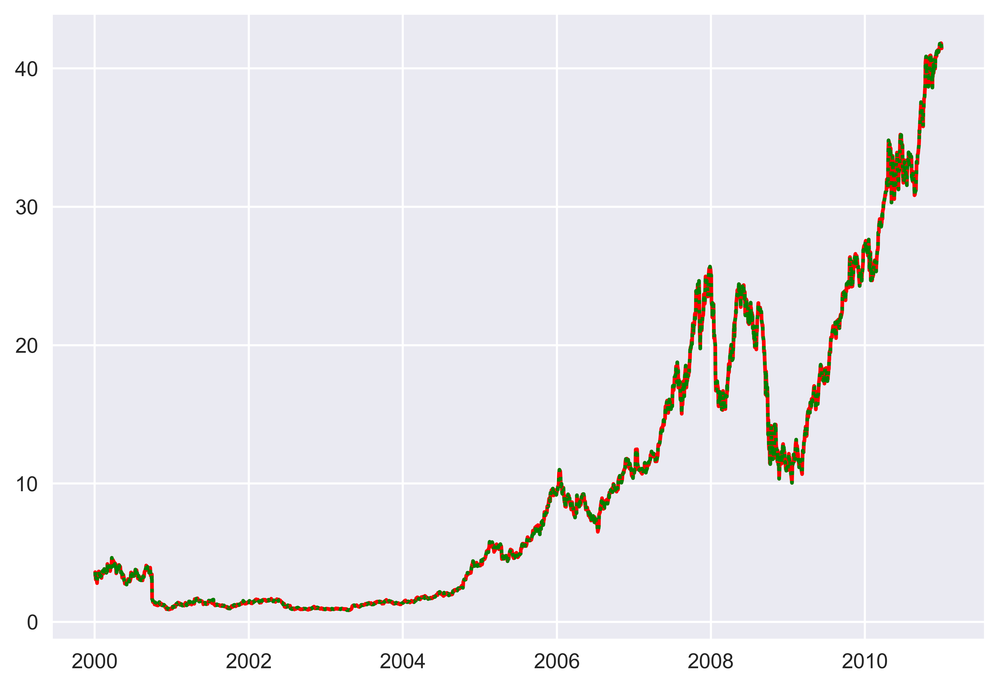

In [17]:
plt.plot(df_quandl.index,df_quandl["Adj. Close"], "r",df_quandl.index, scaling_factor_adjusted*df_yahoo["Adj Close"], "g:")

### Non adjusted

I am not really sure what the difference is here :S


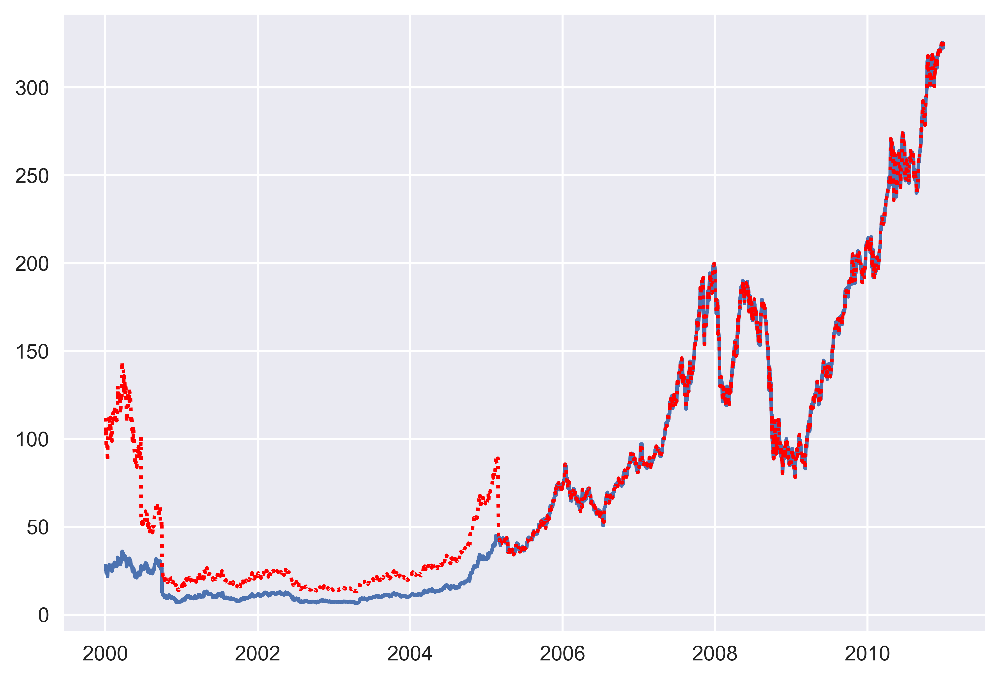

In [18]:
scaling_factor_adjusted = df_quandl["Close"].iloc[-1]/ df_yahoo["Close"].iloc[-1]
plt.plot(df_yahoo.index,scaling_factor_adjusted*df_yahoo["Close"], df_quandl.index,df_quandl["Close"], "r:")

print("I am not really sure what the difference is here :S")

## Converting prices to returns

### How to do it...

1. Import the libraries:

In [19]:
import pandas as pd 
import numpy as np
import yfinance as yf

2. Download the data and keep the adjusted close prices only:

In [20]:
df = yf.download('AAPL', 
                 start='2000-01-01', 
                 end='2010-12-31',
                 progress=False)

df = df.loc[:, ['Adj Close']]

In [21]:
df.rename(columns={'Adj Close':'adj_close'}, inplace=True)

3. Convert adjusted close prices to simple and log returns:

In [22]:
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))

4. Inspect the output:

In [23]:
df.head()

,adj_close,simple_rtn,log_rtn
Date,,,
2000-01-03,0.863657,NaN,NaN
2000-01-04,0.790842,-0.084311,-0.088078
2000-01-05,0.802415,0.014634,0.014528
2000-01-06,0.732975,-0.086539,-0.090514
2000-01-07,0.767695,0.047368,0.046281


### There's more

1. Import libraries and authenticate:

In [24]:
import pandas as pd
import quandl


quandl.ApiConfig.api_key = QUANDL_KEY

2. Create a DataFrame with all possible dates and left join the prices on it:

In [25]:
df_all_dates = pd.DataFrame(index=pd.date_range(start='1999-12-31', 
                                                end='2010-12-31'))
df = df_all_dates.join(df[['adj_close']], how='left') \
                 .fillna(method='ffill') \
                 .asfreq('M')

3. Download inflation data from Quandl:

In [26]:
df_cpi = quandl.get(dataset='RATEINF/CPI_USA', 
                    start_date='1999-12-01', 
                    end_date='2010-12-31')
df_cpi.rename(columns={'Value':'cpi'}, inplace=True)

4. Merge inflation data to prices:

In [27]:
df_merged = df.join(df_cpi, how='left')

5. Calculate simple returns and inflation rate:

In [28]:
df_merged['simple_rtn'] = df_merged.adj_close.pct_change()
df_merged['inflation_rate'] = df_merged.cpi.pct_change()

In [29]:
df_merged

,adj_close,cpi,simple_rtn,inflation_rate
1999-12-31,NaN,168.300,NaN,NaN
2000-01-31,0.800486,168.800,NaN,0.002971
2000-02-29,0.884392,169.800,0.104819,0.005924
2000-03-31,1.047865,171.200,0.184842,0.008245
2000-04-30,0.957207,171.300,-0.086517,0.000584
...,...,...,...,...
2010-08-31,7.502583,218.312,-0.055005,0.001381
2010-09-30,8.757125,218.439,0.167215,0.000582
2010-10-31,9.288879,218.711,0.060722,0.001245
2010-11-30,9.602749,218.803,0.033790,0.000421


6. Adjust returns for inflation:

In [30]:
df_merged['real_rtn'] = (df_merged.simple_rtn + 1) / (df_merged.inflation_rate + 1) - 1
df_merged.head()

,adj_close,cpi,simple_rtn,inflation_rate,real_rtn
1999-12-31,NaN,168.3,NaN,NaN,NaN
2000-01-31,0.800486,168.8,NaN,0.002971,NaN
2000-02-29,0.884392,169.8,0.104819,0.005924,0.098313
2000-03-31,1.047865,171.2,0.184842,0.008245,0.175153
2000-04-30,0.957207,171.3,-0.086517,0.000584,-0.087050


Plot the data after inflation is taken into account

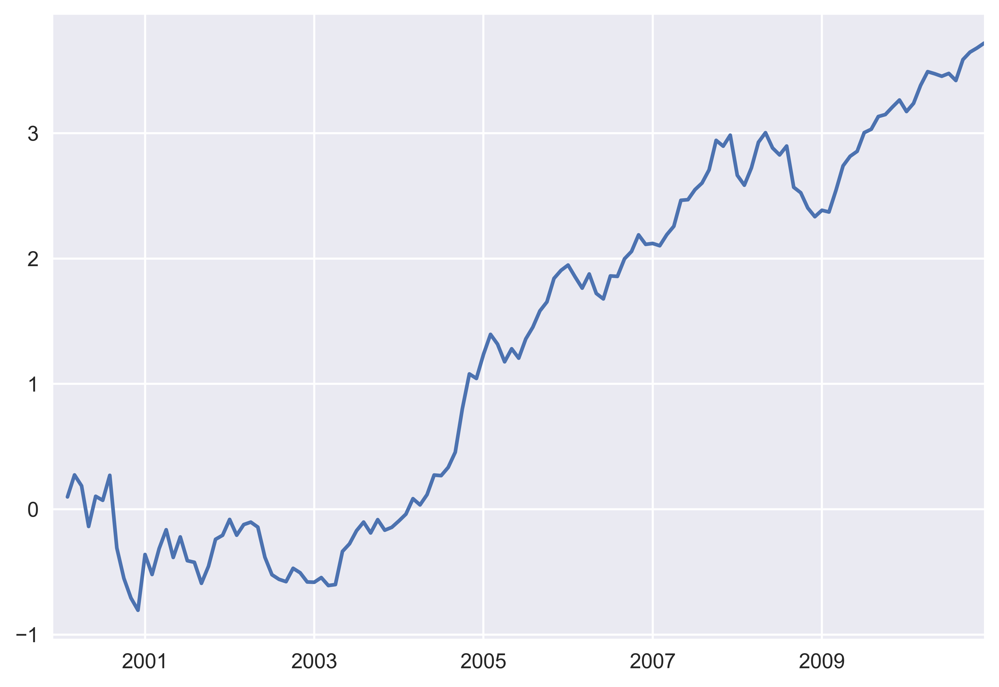

In [31]:
df_merged.real_rtn.cumsum().plot()

## Changing frequency

0. Obtain the simple returns in case of starting in this recipe:

In [32]:
import pandas as pd 
import yfinance as yf

# download data 
df = yf.download('AAPL', 
                 start='2000-01-01', 
                 end='2010-12-31', 
                 auto_adjust=False,
                 progress=False)

# keep only the adjusted close price
df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close': 'adj_close'}, inplace=True)

# calculate simple returns
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))

# remove redundant data
df.drop('adj_close', axis=1, inplace=True)
df.dropna(axis=0, inplace=True)

df.head()

,log_rtn
Date,
2000-01-04,-0.088078
2000-01-05,0.014528
2000-01-06,-0.090514
2000-01-07,0.046281
2000-01-10,-0.017745


1. Import the libraries:

In [33]:
import pandas as pd 

2. Define the function for calculating the realized volatility: 

Notes:
- Here, he is assuming that the mean of returns is zero. This is not necessarily standard. 
- See https://quant.stackexchange.com/questions/17812/a-good-way-to-calculate-the-realised-daily-volatility for a discussion of this.
- Also, do we want to use the regular moving average (as we do here) or the EWMA?

In [34]:
def realized_volatility(x):
    return np.sqrt(np.sum(x**2))

3. Calculate monthly realized volatility:

In [35]:
df_rv = df.groupby(pd.Grouper(freq='M')).apply(realized_volatility)
df_rv.rename(columns={'log_rtn': 'rv'}, inplace=True)

4. Annualize the values:

In [36]:
df_rv.rv = df_rv.rv * np.sqrt(12)

5. Plot the results:

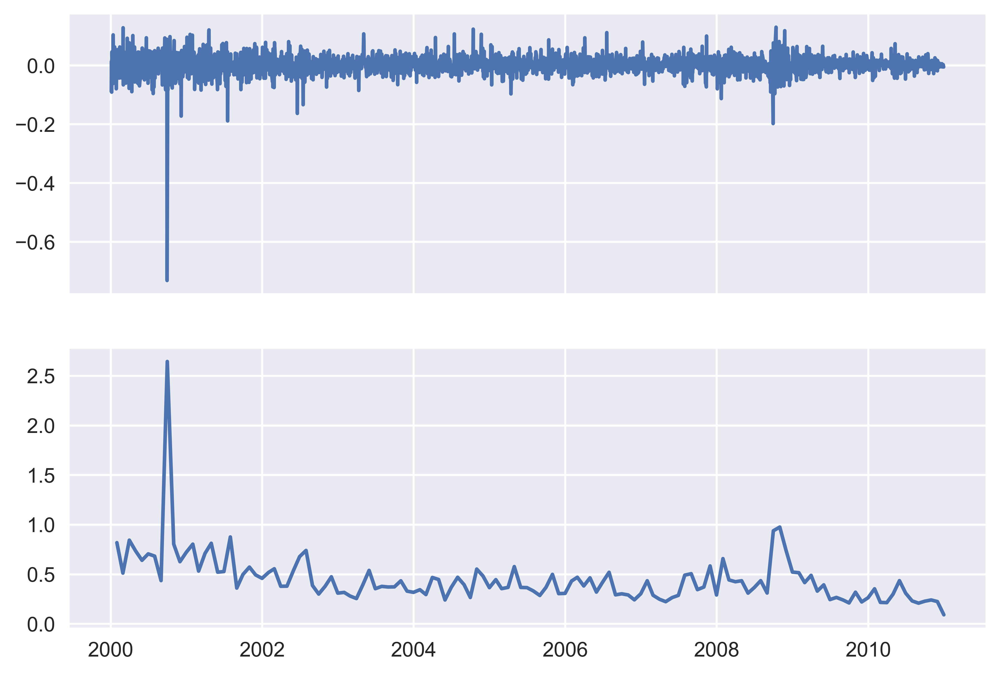

In [37]:
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(df)
ax[1].plot(df_rv)

# plt.tight_layout()
# plt.savefig('images/ch1_im6.png')
plt.show()

## Visualizing time series data

### Getting ready

In [38]:
import pandas as pd 
import yfinance as yf

# download data as pandas DataFrame
df = yf.download('MSFT', auto_adjust = False, progress=False)
df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close': 'adj_close'}, inplace=True)

# create simple and log returns
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close / df.adj_close.shift(1))

# dropping NA's in the first row
df.dropna(how = 'any', inplace = True)

### How to do it...

#### the `plot` method of pandas

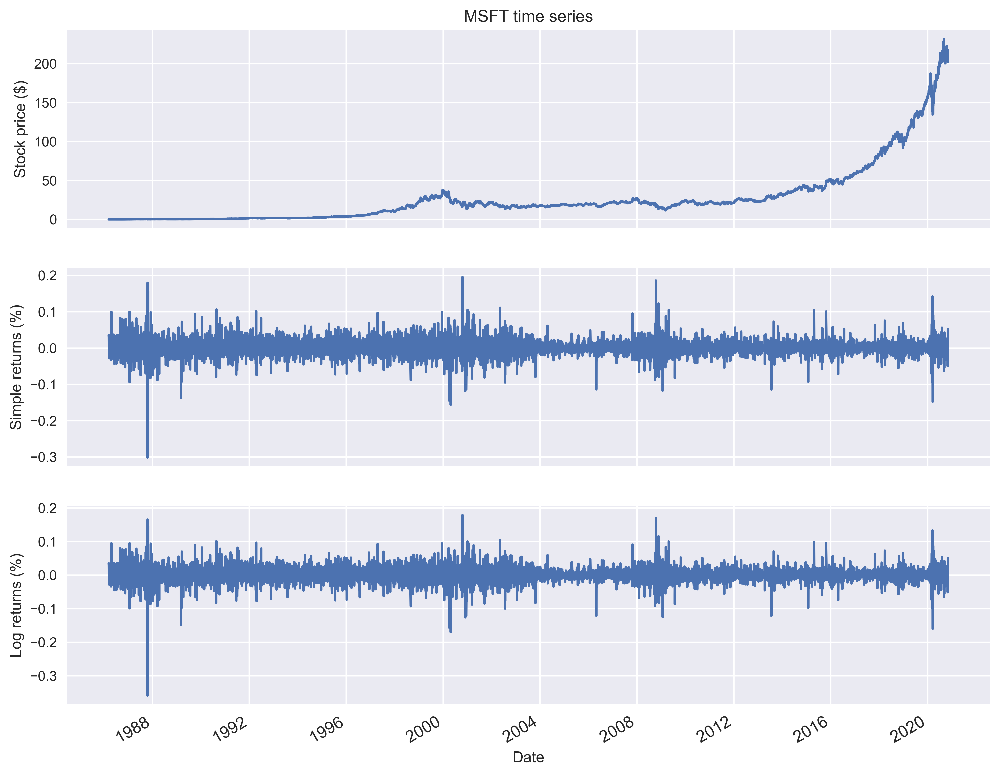

In [39]:
fig, ax = plt.subplots(3, 1, figsize=(12, 10), sharex=True)

# add prices
df.adj_close.plot(ax=ax[0])
ax[0].set(title = 'MSFT time series',
          ylabel = 'Stock price ($)')
    
# add simple returns 
df.simple_rtn.plot(ax=ax[1])
ax[1].set(ylabel = 'Simple returns (%)')

# add log returns 
df.log_rtn.plot(ax=ax[2])
ax[2].set(xlabel = 'Date', 
          ylabel = 'Log returns (%)')

ax[2].tick_params(axis='x', 
                  which='major', 
                  labelsize=12)

# plt.tight_layout()
# plt.savefig('images/ch1_im7.png')
plt.show()

#### `plotly` + `cufflinks`

1. Import the libraries and handle the settings:

In [40]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

# set up settings (run it once)
#cf.set_config_file(world_readable=True, theme='pearl',offline=True)

# initialize notebook display
init_notebook_mode()

2. Create the plots:

In [41]:
df.iplot(subplots=True, shape=(3,1), shared_xaxes=True, title='MSFT time series')

## Identifying outliers

0: Repeat the steps from recipe *Converting prices to returns*:

In [42]:
import pandas as pd 
import yfinance as yf

In [43]:
df = yf.download('AAPL', 
                 start='2000-01-01', 
                 end='2010-12-31',
                 progress=False)

df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close':'adj_close'}, inplace=True)

In [44]:
df['simple_rtn'] = df.adj_close.pct_change()

In [45]:
df.head()

,adj_close,simple_rtn
Date,,
2000-01-03,0.863657,NaN
2000-01-04,0.790842,-0.084311
2000-01-05,0.802415,0.014634
2000-01-06,0.732975,-0.086539
2000-01-07,0.767695,0.047368


1. Calculate the rolling mean and standard deviation:

In [46]:
df_rolling = df[['simple_rtn']].rolling(window=21) \
                               .agg(['mean', 'std'])

In [49]:
df_rolling.columns = df_rolling.columns.droplevel()

In [50]:
df_rolling

,mean,std
Date,,
2000-01-03,NaN,NaN
2000-01-04,NaN,NaN
2000-01-05,NaN,NaN
2000-01-06,NaN,NaN
2000-01-07,NaN,NaN
...,...,...
2010-12-23,0.002274,0.008078
2010-12-27,0.001496,0.007040
2010-12-28,0.001582,0.007040


2. Join the rolling metrics to the original data:

In [51]:
df_outliers = df.join(df_rolling)

In [52]:
df_outliers

,adj_close,simple_rtn,mean,std
Date,,,,
2000-01-03,0.863657,NaN,NaN,NaN
2000-01-04,0.790842,-0.084311,NaN,NaN
2000-01-05,0.802415,0.014634,NaN,NaN
2000-01-06,0.732975,-0.086539,NaN,NaN
2000-01-07,0.767695,0.047368,NaN,NaN
...,...,...,...,...
2010-12-23,9.986981,-0.004797,0.002274,0.008078
2010-12-27,10.020309,0.003337,0.001496,0.007040
2010-12-28,10.044692,0.002433,0.001582,0.007040


3. Define a function for detecting outliers:

In [53]:
def indentify_outliers(row, n_sigmas=3):
    '''
    Function for identifying the outliers using the 3 sigma rule. 
    The row must contain the following columns/indices: simple_rtn, mean, std.
    
    Parameters
    ----------
    row : pd.Series
        A row of a pd.DataFrame, over which the function can be applied.
    n_sigmas : int
        The number of standard deviations above/below the mean - used for detecting outliers
        
    Returns
    -------
    0/1 : int
        An integer with 1 indicating an outlier and 0 otherwise.
    '''
    x = row['simple_rtn']
    mu = row['mean']
    sigma = row['std']
    
    if (x > mu + 3 * sigma) | (x < mu - 3 * sigma):
        return 1
    else:
        return 0 

4. Identify the outliers and extract their values for later use:

In [54]:
df_outliers['outlier'] = df_outliers.apply(indentify_outliers, 
                                           axis=1)
outliers = df_outliers.loc[df_outliers['outlier'] == 1, 
                           ['simple_rtn']]

5. Plot the results: 

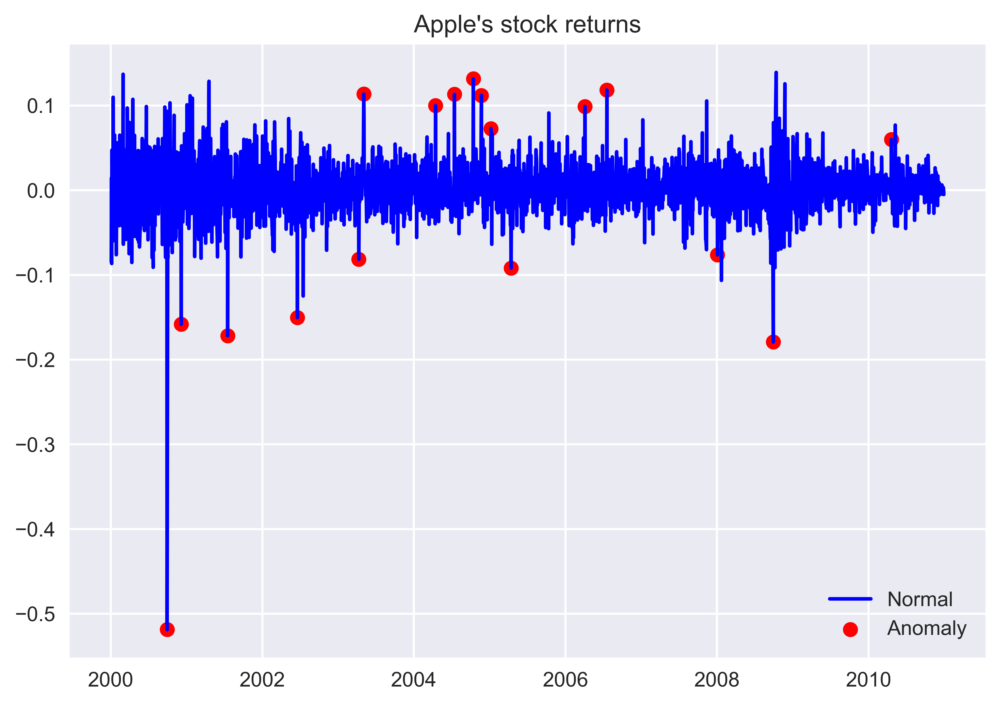

In [57]:
fig, ax = plt.subplots()

ax.plot(df_outliers.index, df_outliers.simple_rtn, 
        color='blue', label='Normal')
ax.scatter(outliers.index, outliers.simple_rtn, 
           color='red', label='Anomaly')
ax.set_title("Apple's stock returns")
ax.legend(loc='lower right')

# plt.tight_layout()
# plt.savefig('images/ch1_im9.png')
plt.show()

There are many different methods of identifying outliers in a time series, for example, using
Isolation Forest, Hampel Filter, Support Vector Machines, and z-score (which is similar to
the presented approach).

- Isolation forest: https://en.wikipedia.org/wiki/Isolation_forest
- Hampel filter: https://towardsdatascience.com/outlier-detection-with-hampel-filter-85ddf523c73d
- SVM: https://towardsdatascience.com/support-vector-machine-svm-for-anomaly-detection-73a8d676c331
- z score (and more!): https://statisticsbyjim.com/basics/outliers/#:~:text=Using%20Z%2Dscores%20to%20Detect%20Outliers&text=Z%2Dscores%20are%20the%20number,mean%20that%20each%20value%20falls.&text=The%20further%20away%20an%20observation's,3%20or%20further%20from%20zero.

## Investigating stylized facts of asset returns

### How to do it...

1. Import the libraries:

In [59]:
import pandas as pd 
import numpy as np
import yfinance as yf
import seaborn as sns 
import scipy.stats as scs
import statsmodels.api as sm
import statsmodels.tsa.api as smt

2. Download the S&P 500 data and calculate the returns:

In [60]:
df = yf.download('^GSPC', 
                 start='1985-01-01', 
                 end='2018-12-31',
                 progress=False)

df = df[['Adj Close']].rename(columns={'Adj Close': 'adj_close'})
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))
df = df[['adj_close', 'log_rtn']].dropna(how = 'any')

#### Fact 1 - Non-Gaussian distribution of returns

1. Calculate the Normal PDF using the mean and standard deviation of the observed returns:

In [61]:
r_range = np.linspace(min(df.log_rtn), max(df.log_rtn), num=1000)
mu = df.log_rtn.mean()
sigma = df.log_rtn.std()
norm_pdf = scs.norm.pdf(r_range, loc=mu, scale=sigma)   

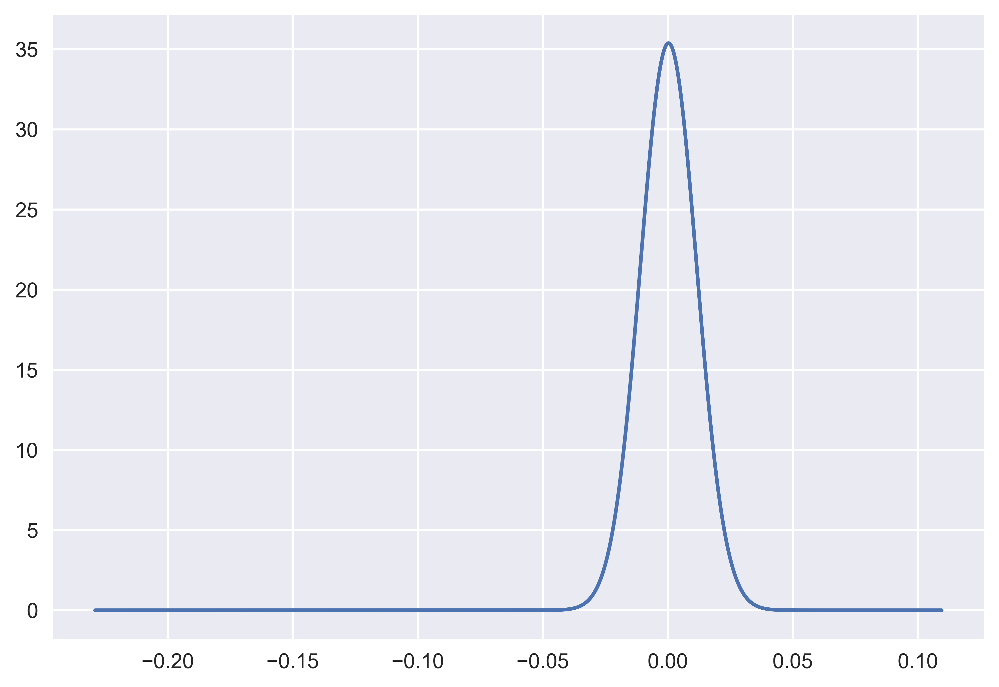

In [63]:
plt.plot(r_range,norm_pdf)

2. Plot the histogram and the Q-Q Plot:

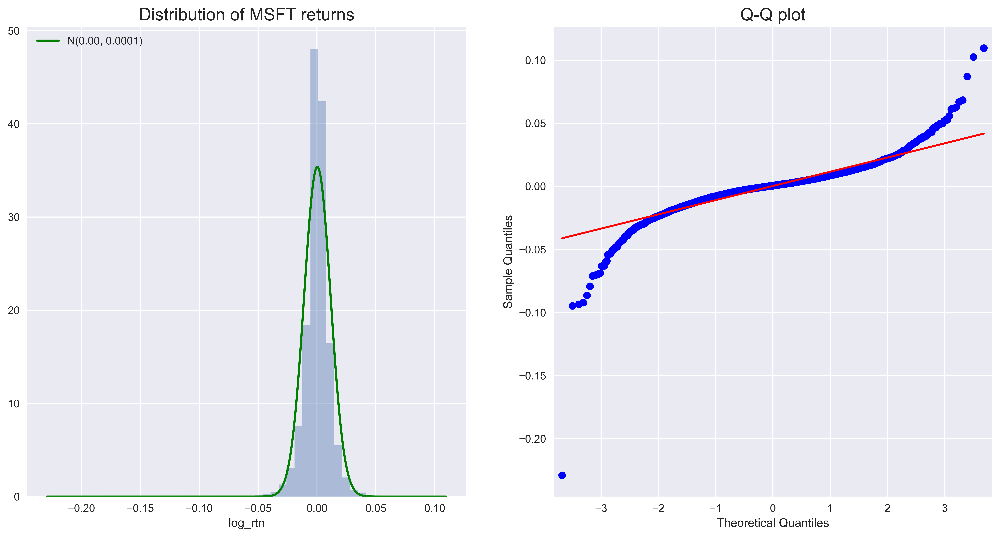

In [65]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# histogram
sns.distplot(df.log_rtn, kde=False, norm_hist=True, ax=ax[0])                                    
ax[0].set_title('Distribution of MSFT returns', fontsize=16)                                                    
ax[0].plot(r_range, norm_pdf, 'g', lw=2, 
           label=f'N({mu:.2f}, {sigma**2:.4f})')
ax[0].legend(loc='upper left');

# Q-Q plot
qq = sm.qqplot(df.log_rtn.values, line='s', ax=ax[1])
ax[1].set_title('Q-Q plot', fontsize = 16)

# plt.tight_layout()
# plt.savefig('images/ch1_im10.png')
plt.show()

3. Print the summary statistics of the log returns:

The Jarque-Bera test for Normality (high test statistic implies non-Gaussian)

https://en.wikipedia.org/wiki/Jarque%E2%80%93Bera_test

In [66]:
jb_test = scs.jarque_bera(df.log_rtn.values)

print('---------- Descriptive Statistics ----------')
print('Range of dates:', min(df.index.date), '-', max(df.index.date))
print('Number of observations:', df.shape[0])
print(f'Mean: {df.log_rtn.mean():.4f}')
print(f'Median: {df.log_rtn.median():.4f}')
print(f'Min: {df.log_rtn.min():.4f}')
print(f'Max: {df.log_rtn.max():.4f}')
print(f'Standard Deviation: {df.log_rtn.std():.4f}')
print(f'Skewness: {df.log_rtn.skew():.4f}')
print(f'Kurtosis: {df.log_rtn.kurtosis():.4f}') 
print(f'Jarque-Bera statistic: {jb_test[0]:.2f} with p-value: {jb_test[1]:.2f}')

---------- Descriptive Statistics ----------
Range of dates: 1985-01-03 - 2018-12-28
Number of observations: 8568
Mean: 0.0003
Median: 0.0006
Min: -0.2290
Max: 0.1096
Standard Deviation: 0.0113
Skewness: -1.2628
Kurtosis: 28.0156
Jarque-Bera statistic: 282134.38 with p-value: 0.00


In [78]:
np.random.seed(1)
norm_vec = np.random.normal(size=1000)
scs.jarque_bera(norm_vec)

Jarque_beraResult(statistic=3.052405829198442, pvalue=0.21735943470493713)

#### Fact 2 - Volatility Clustering

1. Run the following code to visualize the log returns series:

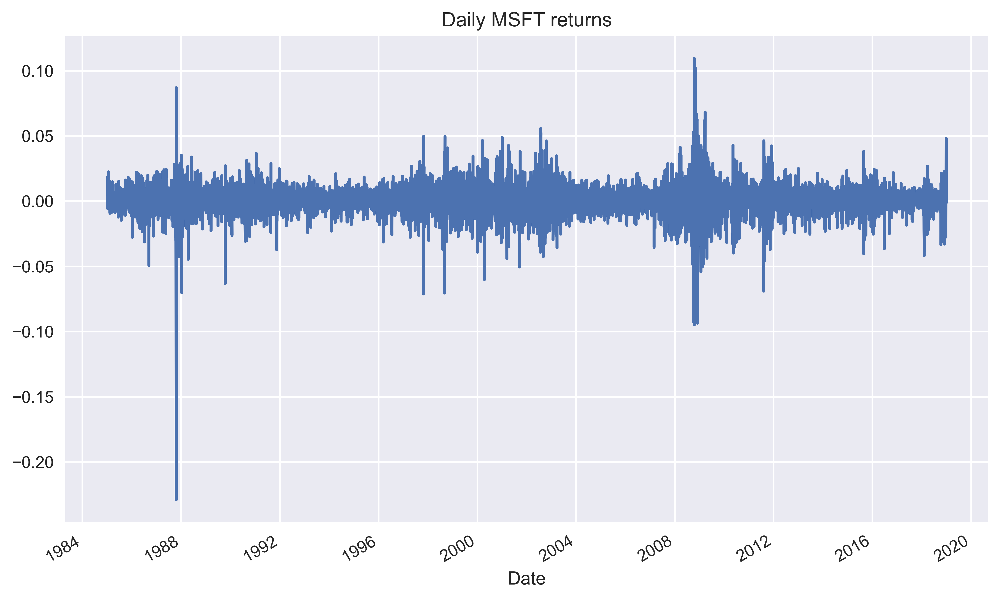

In [79]:
df.log_rtn.plot(title='Daily MSFT returns', figsize=(10, 6))

# plt.tight_layout()
# plt.savefig('images/ch1_im12.png')
plt.show()

#### Fact 3 - Absence of autocorrelation in returns

1. Define the parameters for creating the Autocorrelation plots:

In [85]:
N_LAGS = 50
SIGNIFICANCE_LEVEL = 0.05

2. Run the following code to create ACF plot of log returns:

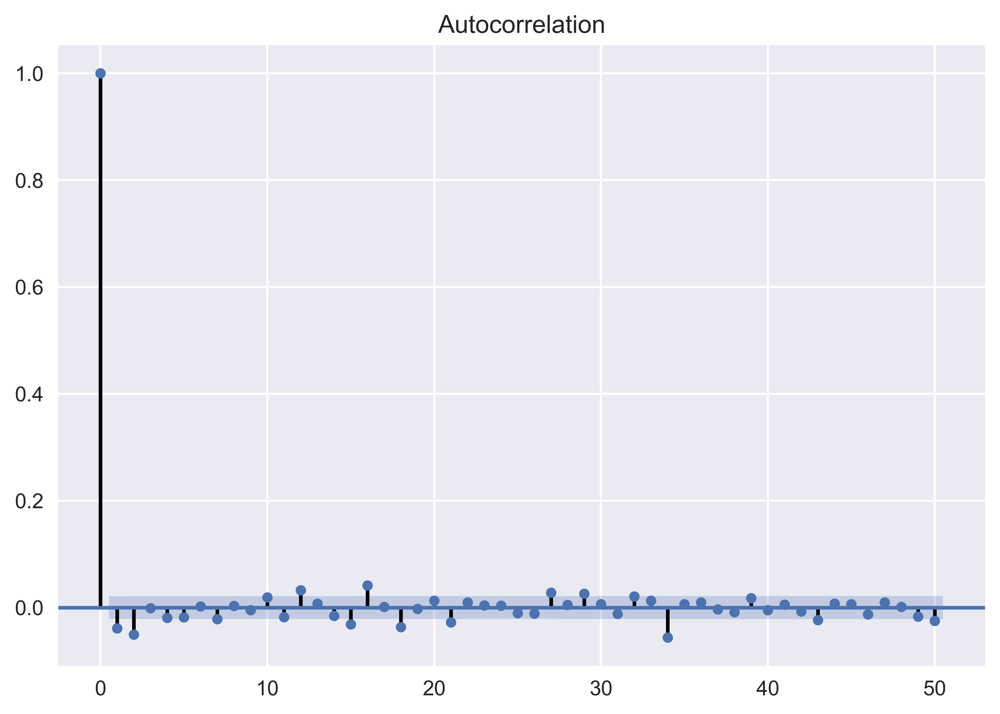

In [86]:
acf = smt.graphics.plot_acf(df.log_rtn, 
                            lags=N_LAGS, 
                            alpha=SIGNIFICANCE_LEVEL)

# plt.tight_layout()
# plt.savefig('images/ch1_im13.png')
plt.show()

#### Fact 4 - Small and decreasing autocorrelation in squared/absolute returns

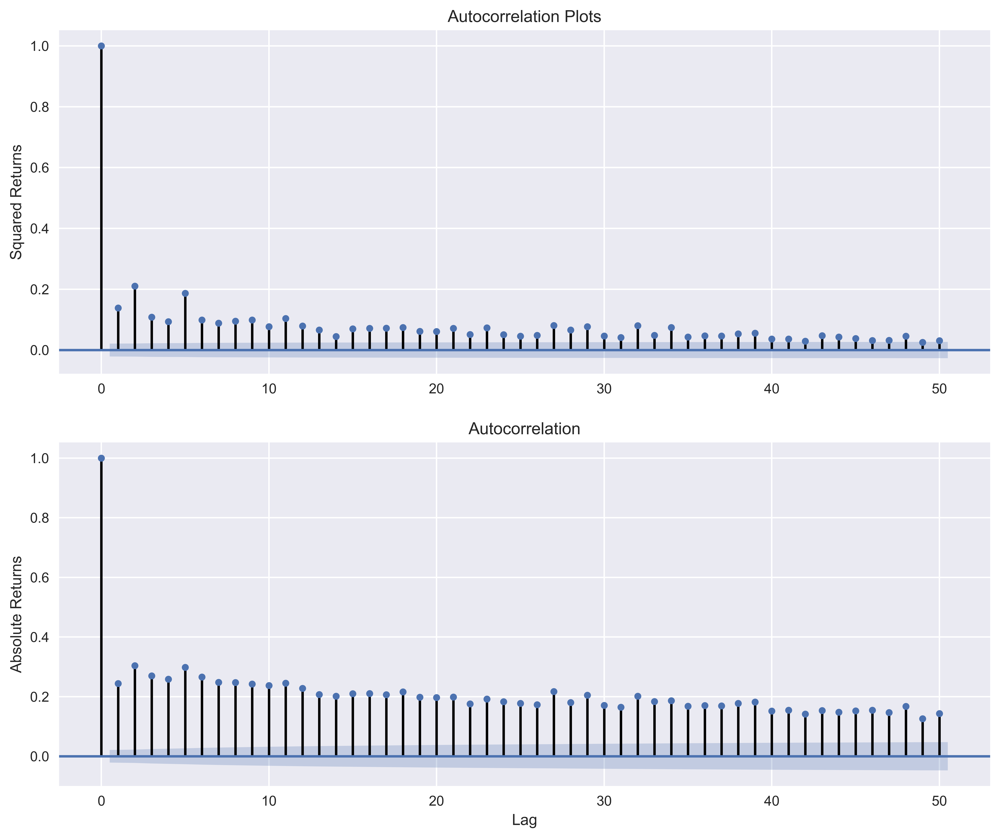

In [87]:
fig, ax = plt.subplots(2, 1, figsize=(12, 10))

smt.graphics.plot_acf(df.log_rtn ** 2, lags=N_LAGS, 
                      alpha=SIGNIFICANCE_LEVEL, ax = ax[0])
ax[0].set(title='Autocorrelation Plots',
          ylabel='Squared Returns')

smt.graphics.plot_acf(np.abs(df.log_rtn), lags=N_LAGS, 
                      alpha=SIGNIFICANCE_LEVEL, ax = ax[1])
ax[1].set(ylabel='Absolute Returns',
          xlabel='Lag')

# plt.tight_layout()
# plt.savefig('images/ch1_im14.png')
plt.show()

#### Fact 5 - Leverage effect

1. Calculate volatility measures as moving standard deviations

In [88]:
df['moving_std_252'] = df[['log_rtn']].rolling(window=252).std()
df['moving_std_21'] = df[['log_rtn']].rolling(window=21).std()

2. Plot all the series:

In [89]:
fig, ax = plt.subplots(3, 1, figsize=(18, 15), 
                       sharex=True)

df.adj_close.plot(ax=ax[0])
ax[0].set(title='MSFT time series',
          ylabel='Stock price ($)')

df.log_rtn.plot(ax=ax[1])
ax[1].set(ylabel='Log returns (%)')

df.moving_std_252.plot(ax=ax[2], color='r', 
                       label='Moving Volatility 252d')
df.moving_std_21.plot(ax=ax[2], color='g', 
                      label='Moving Volatility 21d')
ax[2].set(ylabel='Moving Volatility',
          xlabel='Date')
ax[2].legend()

# plt.tight_layout()
# plt.savefig('images/ch1_im15.png')
plt.show()

### There's more

1. Download and preprocess the prices of S&P 500 and VIX:

In [90]:
df = yf.download(['^GSPC', '^VIX'], 
                 start='1985-01-01', 
                 end='2018-12-31',
                 progress=False)
df = df[['Adj Close']]
df.columns = df.columns.droplevel(0)
df = df.rename(columns={'^GSPC': 'sp500', '^VIX': 'vix'})

2. Calculate log returns:

In [91]:
df['log_rtn'] = np.log(df.sp500 / df.sp500.shift(1))
df['vol_rtn'] = np.log(df.vix / df.vix.shift(1))
df.dropna(how='any', axis=0, inplace=True)

3. Plot a scatterplot with the returns on the axes and fit a regression line to identify trend:

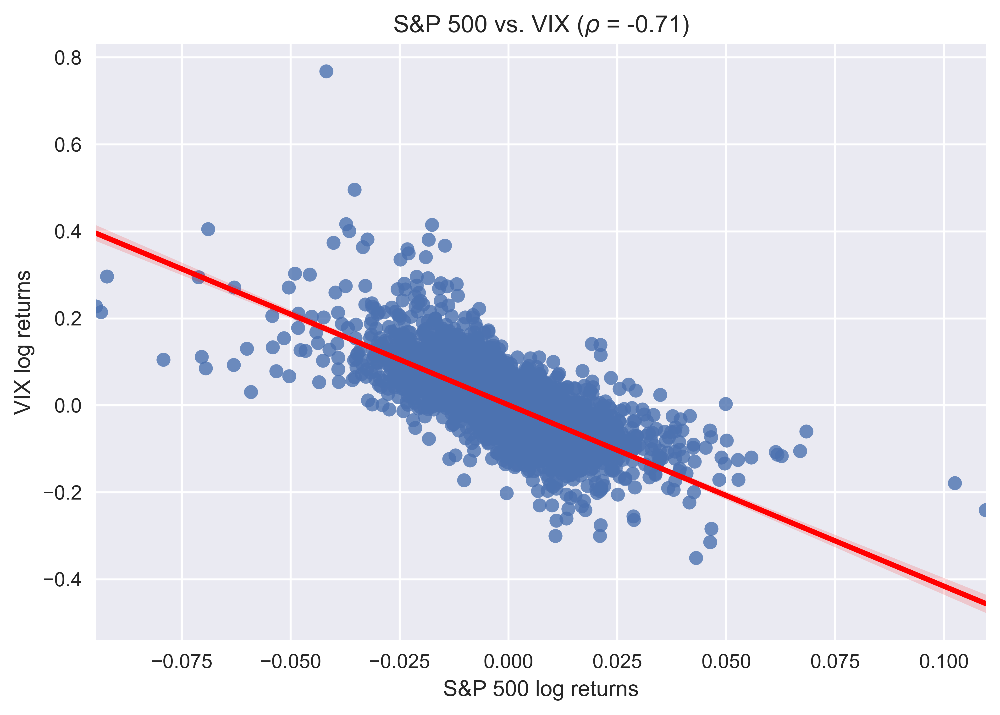

In [92]:
corr_coeff = df.log_rtn.corr(df.vol_rtn)

ax = sns.regplot(x='log_rtn', y='vol_rtn', data=df, 
                 line_kws={'color': 'red'})
ax.set(title=f'S&P 500 vs. VIX ($\\rho$ = {corr_coeff:.2f})',
       ylabel='VIX log returns',
       xlabel='S&P 500 log returns')

# plt.tight_layout()
# plt.savefig('images/ch1_im16.png')
plt.show()

# Things for Ian

### Forex getting package (forex-python)

Install with ```pip install forex-python```

In [93]:
from datetime import datetime
from forex_python.converter import get_rate

In [94]:
t1 = datetime(2001, 10, 18)  # the 18th of October, 2001
get_rate("USD", "GBP", t1)

0.6923332595

In [95]:
1/get_rate("GBP", "USD", t1)

0.6923332594613284

In [106]:
today

datetime.date(2020, 11, 4)

In [112]:
today = datetime.now()
get_rate("GBP", "USD",today)

1.3029993108

### UK Holidays API

Couldn't get school holidays API

Install with ```pip install govuk-bank-holidays```

In [ ]:
from govuk_bank_holidays.bank_holidays import BankHolidays
bank_holidays = BankHolidays()

In [ ]:
for bank_holiday in bank_holidays.get_holidays():
    print(bank_holiday['title'], '>', bank_holiday['date'])
print(bank_holidays.get_next_holiday())
# see govuk_bank_holidays/bank_holidays.py source file for more methods and arguments…

# choose a different locale for holiday titles and notes
bank_holidays = BankHolidays(locale='cy')